### Train Flow Upscaler

Main training code, uses dataset generated in `notebooks/flow_upscaler/generate_flux_samples.ipynb`

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from transformers import CLIPTextModel, CLIPTokenizer
from diffusers.models import AutoencoderKLFlux2
from diffusers import FlowMatchEulerDiscreteScheduler
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
from PIL import Image
import random


from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm

device = "cuda"
plt.style.use("dark_background")

In [2]:
text_encoder = CLIPTextModel.from_pretrained(
    "../../stable-diffusion-xl-base-1.0/text_encoder"
).to("cuda", torch.float32)
tokenizer = CLIPTokenizer.from_pretrained(
    "../../stable-diffusion-xl-base-1.0/tokenizer"
)
vae = AutoencoderKLFlux2.from_pretrained("../../FLUX.2-klein-4B/vae", device=device).to(
    device
)
scheduler = FlowMatchEulerDiscreteScheduler.from_pretrained(
    "../../FLUX.2-klein-4B/scheduler", device=device
)

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

In [3]:
latents_bn_mean = vae.bn.running_mean.view(1, -1, 1, 1).to(device)
latents_bn_std = torch.sqrt(
    vae.bn.running_var.view(1, -1, 1, 1) + vae.config.batch_norm_eps
).to(device)


def patchify_latents(latents):
    batch_size, num_channels_latents, height, width = latents.shape
    latents = latents.view(
        batch_size, num_channels_latents, height // 2, 2, width // 2, 2
    )
    latents = latents.permute(0, 1, 3, 5, 2, 4)
    latents = latents.reshape(
        batch_size, num_channels_latents * 4, height // 2, width // 2
    )
    return latents


def unpatchify_latents(latents):
    batch_size, num_channels_latents, height, width = latents.shape
    latents = latents.reshape(
        batch_size, num_channels_latents // (2 * 2), 2, 2, height, width
    )
    latents = latents.permute(0, 1, 4, 2, 5, 3)
    latents = latents.reshape(
        batch_size, num_channels_latents // (2 * 2), height * 2, width * 2
    )
    return latents


def norm_unpatchified_latents(latents):
    latents = patchify_latents(latents)
    latents = latents - latents_bn_mean
    latents = latents / latents_bn_std
    latents = unpatchify_latents(latents)

    return latents


def denorm_unpatchified_latents(latents):
    latents = patchify_latents(latents)
    latents = latents * latents_bn_std
    latents = latents + latents_bn_mean
    latents = unpatchify_latents(latents)

    return latents


def torch_image_to_np(image):
    image = image.add(1).div(2)
    image = image.float()
    image = image.squeeze(0).permute(1, 2, 0)
    image = image.clip(0, 1)
    image = image.cpu().numpy()

    return image

In [4]:
train_batch_size = 16

In [ ]:
class FlowUpscalerDataset(Dataset):
    def __init__(self):
        self.noise = torch.load("../../precomputes/flow_upscaler/noise-example.pt")
        self.latents_big = torch.load(
            "../../precomputes/flow_upscaler/latents_orig-example.pt"
        )
        self.latents_div_2 = torch.load(
            "../../precomputes/flow_upscaler/latents_div_2-example.pt"
        )

    def __len__(self):
        return len(self.latents_big)

    def __getitem__(self, idx):
        return (self.noise[idx], self.latents_big[idx], self.latents_div_2[idx])

In [6]:
dataset = FlowUpscalerDataset()

In [7]:
print(dataset.noise.shape, dataset.noise.dtype, dataset.noise.device)
print(dataset.latents_big.shape, dataset.latents_big.dtype, dataset.latents_big.device)
print(
    dataset.latents_div_2.shape,
    dataset.latents_div_2.dtype,
    dataset.latents_div_2.device,
)

torch.Size([100, 32, 128, 128]) torch.float16 cpu
torch.Size([100, 32, 128, 128]) torch.float16 cpu
torch.Size([100, 32, 64, 64]) torch.float16 cpu


In [8]:
train_loader = DataLoader(dataset, batch_size=train_batch_size, shuffle=True)

torch.Size([16, 32, 128, 128]) cpu torch.float16 tensor(-6.0938, dtype=torch.float16) tensor(6.7500, dtype=torch.float16)
torch.Size([16, 32, 64, 64]) cpu torch.float16 tensor(-7.0312, dtype=torch.float16) tensor(6.3750, dtype=torch.float16)


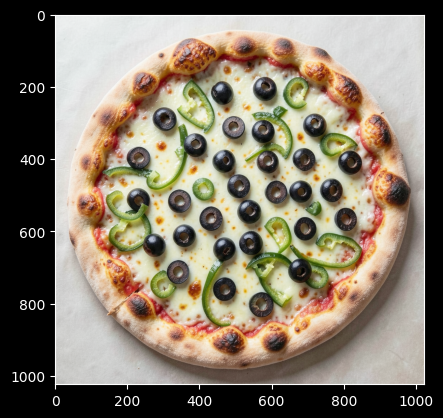

In [9]:
noise, latents_big, latents_div_2 = next(iter(train_loader))
print(
    latents_big.shape,
    latents_big.device,
    latents_big.dtype,
    latents_big.min(),
    latents_big.max(),
)
print(
    latents_div_2.shape,
    latents_div_2.device,
    latents_div_2.dtype,
    latents_div_2.min(),
    latents_div_2.max(),
)

with torch.no_grad():
    latents = denorm_unpatchified_latents(latents_big[:1].cuda().float())
    reconstructed = (vae.decode(latents[:1]).sample + 1.0) / 2.0

reconstructed = reconstructed.squeeze(0).permute((1, 2, 0)).cpu().numpy()
reconstructed = np.clip(reconstructed, 0, 1)

plt.imshow(reconstructed)
plt.show()

In [10]:
def make_group_norm(
    channels: int, max_groups: int = 32, eps: float = 1e-6
) -> nn.GroupNorm:
    groups = min(max_groups, channels)
    while channels % groups != 0 and groups > 1:
        groups -= 1
    return nn.GroupNorm(groups, channels, eps=eps)


class SinusoidalTimeEmbedding(nn.Module):
    def __init__(self, dim: int = 128, max_period: int = 10000):
        super().__init__()
        self.dim = dim
        self.max_period = max_period

    def forward(self, timesteps: torch.Tensor) -> torch.Tensor:
        half = self.dim // 2
        timesteps = timesteps.float()

        freqs = torch.exp(
            -torch.log(torch.tensor(float(self.max_period), device=timesteps.device))
            * torch.arange(half, device=timesteps.device, dtype=timesteps.dtype)
            / half
        )
        args = timesteps[:, None] * freqs[None]
        emb = torch.cat([torch.sin(args), torch.cos(args)], dim=-1)

        if self.dim % 2 == 1:
            emb = F.pad(emb, (0, 1))

        return emb


class ConditioningEncoder(nn.Module):
    def __init__(self, time_dim: int = 128, cond_dim: int = 256):
        super().__init__()
        self.time_embed = SinusoidalTimeEmbedding(time_dim)

        self.time_proj = nn.Sequential(
            nn.Linear(time_dim, cond_dim),
            nn.SiLU(),
            nn.Linear(cond_dim, cond_dim),
        )

    def forward(self, timestep: torch.Tensor) -> torch.Tensor:
        time_vec = self.time_proj(self.time_embed(timestep))
        return time_vec


class ConditionedResidualBlock(nn.Module):
    """
    SDXL-style residual block:
      GN -> SiLU -> Conv
      + condition (scale/shift)
      GN -> SiLU -> Dropout -> Conv
      + skip connection
    """

    def __init__(
        self,
        input_channels: int,
        output_channels: int,
        cond_dim: int = 256,
        dropout: float = 0.0,
    ):
        super().__init__()

        self.norm1 = make_group_norm(input_channels)
        self.conv1 = nn.Conv2d(
            input_channels, output_channels, kernel_size=3, padding=1
        )

        self.cond_proj = nn.Sequential(
            nn.SiLU(),
            nn.Linear(cond_dim, 2 * output_channels),
        )

        self.norm2 = make_group_norm(output_channels)
        self.dropout = nn.Dropout(dropout)
        self.conv2 = nn.Conv2d(
            output_channels, output_channels, kernel_size=3, padding=1
        )

        if input_channels != output_channels:
            self.skip = nn.Conv2d(
                input_channels, output_channels, kernel_size=1, bias=False
            )
        else:
            self.skip = nn.Identity()

    def forward(self, x: torch.Tensor, cond: torch.Tensor) -> torch.Tensor:
        residual = self.skip(x)

        h = self.norm1(x)
        h = F.silu(h)
        h = self.conv1(h)

        scale_shift = self.cond_proj(cond)
        scale, shift = scale_shift.chunk(2, dim=1)

        h = self.norm2(h)
        h = h * (1 + scale[:, :, None, None]) + shift[:, :, None, None]
        h = F.silu(h)
        h = self.dropout(h)
        h = self.conv2(h)

        return h + residual


class DownStage(nn.Module):
    def __init__(
        self,
        input_channels: int,
        output_channels: int,
        cond_dim: int = 256,
        dropout: float = 0.0,
        num_blocks: int = 1,
        downsample_first: bool = False,
    ):
        super().__init__()
        self.downsample_first = downsample_first

        self.blocks = nn.ModuleList()
        for i in range(num_blocks):
            in_ch = input_channels if i == 0 else output_channels
            self.blocks.append(
                ConditionedResidualBlock(
                    input_channels=in_ch,
                    output_channels=output_channels,
                    cond_dim=cond_dim,
                    dropout=dropout,
                )
            )

        self.downsample = nn.Conv2d(
            output_channels, output_channels, kernel_size=3, stride=2, padding=1
        )

    def forward(self, x: torch.Tensor, cond: torch.Tensor):

        if self.downsample_first:
            x = self.downsample(x)

        for block in self.blocks:
            x = block(x, cond)
        skip = x

        if not self.downsample_first:
            x = self.downsample(x)

        return x, skip


class UpStage(nn.Module):
    def __init__(
        self,
        input_channels: int,
        skip_channels: int,
        output_channels: int,
        cond_dim: int = 256,
        dropout: float = 0.0,
        num_blocks: int = 1,
    ):
        super().__init__()

        self.upsample = nn.Upsample(
            scale_factor=2, mode="bilinear", align_corners=False
        )

        self.blocks = nn.ModuleList()
        for i in range(num_blocks):
            in_ch = (input_channels + skip_channels) if i == 0 else output_channels
            self.blocks.append(
                ConditionedResidualBlock(
                    input_channels=in_ch,
                    output_channels=output_channels,
                    cond_dim=cond_dim,
                    dropout=dropout,
                )
            )

    def forward(
        self, x: torch.Tensor, skip: torch.Tensor, cond: torch.Tensor
    ) -> torch.Tensor:
        x = self.upsample(x)

        if x.shape[-2:] != skip.shape[-2:]:
            x = F.interpolate(
                x, size=skip.shape[-2:], mode="bilinear", align_corners=False
            )

        x = torch.cat([x, skip], dim=1)

        for block in self.blocks:
            x = block(x, cond)

        return x


class LowResEncoder(nn.Module):
    def __init__(
        self,
        sample_channels: int = 32,
        base_channels: int = 128,
        cond_dim: int = 1024,
        dropout: float = 0.0,
    ):
        super().__init__()

        self.in_conv = nn.Conv2d(
            sample_channels, base_channels, kernel_size=1, padding=0
        )

        self.block_1 = ConditionedResidualBlock(
            input_channels=base_channels,
            output_channels=base_channels,
            cond_dim=cond_dim,
            dropout=dropout,
        )

        self.block_2 = DownStage(
            input_channels=base_channels,
            output_channels=base_channels,
            cond_dim=cond_dim,
            dropout=dropout,
            num_blocks=1,
            downsample_first=True,
        )

        self.block_3 = DownStage(
            input_channels=base_channels,
            output_channels=base_channels,
            cond_dim=cond_dim,
            dropout=dropout,
            num_blocks=1,
            downsample_first=True,
        )

    def forward(self, latents_small, cond):
        x = self.in_conv(latents_small)
        block_1_out = self.block_1(x, cond)
        block_2_out, _ = self.block_2(block_1_out, cond)
        block_3_out, _ = self.block_3(block_2_out, cond)

        return block_1_out, block_2_out, block_3_out


class FilmCond2D(nn.Module):
    def __init__(self, base_channels: int = 256, cond_channels: int = 256):
        super().__init__()

        self.cond_proj = nn.Sequential(
            nn.SiLU(),
            nn.Conv2d(cond_channels, base_channels * 2, kernel_size=1),
        )

    def forward(self, x, cond):
        scale_shift = self.cond_proj(cond)
        scale, shift = scale_shift.chunk(2, dim=1)

        x = x * (1 + scale) + shift

        return x


class UpscalerUNet(nn.Module):
    def __init__(
        self,
        sample_channels: int = 32,
        base_channels: int = 384,
        time_dim: int = 512,
        cond_dim: int = 1024,
        dropout: float = 0.01,
    ):
        super().__init__()

        self.conditioning = ConditioningEncoder(
            time_dim=time_dim,
            cond_dim=cond_dim,
        )

        self.in_conv = nn.Conv2d(
            sample_channels, base_channels, kernel_size=1, padding=0
        )

        self.low_res_encoder = LowResEncoder(base_channels=base_channels)

        self.film_cond_1 = FilmCond2D(
            base_channels=base_channels, cond_channels=base_channels
        )
        self.film_cond_2 = FilmCond2D(
            base_channels=base_channels, cond_channels=base_channels
        )
        self.film_cond_3 = FilmCond2D(
            base_channels=base_channels, cond_channels=base_channels
        )

        self.down_stages = nn.ModuleList(
            [
                DownStage(
                    input_channels=base_channels,
                    output_channels=base_channels,
                    cond_dim=cond_dim,
                    dropout=dropout,
                    num_blocks=3,
                ),
                DownStage(
                    input_channels=base_channels,
                    output_channels=base_channels,
                    cond_dim=cond_dim,
                    dropout=dropout,
                    num_blocks=2,
                ),
            ]
        )

        self.mid_stages = nn.ModuleList(
            [
                ConditionedResidualBlock(
                    input_channels=base_channels,
                    output_channels=base_channels,
                    cond_dim=cond_dim,
                    dropout=dropout,
                )
                for i in range(1)
            ]
        )

        self.up_stages = nn.ModuleList(
            [
                UpStage(
                    input_channels=base_channels,
                    skip_channels=base_channels,
                    output_channels=base_channels,
                    cond_dim=cond_dim,
                    dropout=dropout,
                    num_blocks=2,
                ),
                UpStage(
                    input_channels=base_channels,
                    skip_channels=base_channels,
                    output_channels=base_channels,
                    cond_dim=cond_dim,
                    dropout=dropout,
                    num_blocks=3,
                ),
            ]
        )

        self.out_conv = nn.Conv2d(
            base_channels, sample_channels, kernel_size=1, padding=0
        )

    def forward(
        self, sample: torch.Tensor, timestep: torch.Tensor, latents_small: torch.Tensor
    ) -> torch.Tensor:
        cond = self.conditioning(timestep)

        B, C, H, W = sample.shape

        lr_cond_1, lr_cond_2, lr_cond_3 = self.low_res_encoder(latents_small, cond)

        lr_cond_1 = torch.nn.functional.interpolate(lr_cond_1, (H, W), mode="bilinear")
        lr_cond_2 = torch.nn.functional.interpolate(
            lr_cond_2, (H // 2, W // 2), mode="bilinear"
        )
        lr_cond_3 = torch.nn.functional.interpolate(
            lr_cond_3, (H // 4, W // 4), mode="bilinear"
        )

        x = self.in_conv(sample)
        x = self.film_cond_1(x, lr_cond_1)

        skips = []

        x, skip = self.down_stages[0](x, cond)
        skips.append(skip)

        x = self.film_cond_2(x, lr_cond_2)

        x, skip = self.down_stages[1](x, cond)
        skips.append(skip)

        x = self.film_cond_3(x, lr_cond_3)

        for mid in self.mid_stages:
            x = mid(x, cond)

        for up in self.up_stages:
            x = up(x, skips.pop(), cond)

        x = self.out_conv(x)
        return x

In [11]:
unet = UpscalerUNet()
unet = unet.to(device)

optimizer = torch.optim.AdamW(unet.parameters(), lr=1e-4)
num_train_timesteps = 1000

total_params = sum(p.numel() for p in unet.parameters())
print("Total params:", total_params / 1000000, "M")

Total params: 59.267104 M


In [12]:
import os
import re
import numpy as np
import matplotlib.pyplot as plt
import torch
from IPython.display import clear_output


def _get_next_sample_index(save_directory):
    """
    Finds the next available integer index for sample files
    of the form sample_<index>.png or sample_epochX_<index>.png.
    """
    pattern = re.compile(r"sample_(?:epoch\d+_)?(\d+)\.png")
    max_index = -1

    for fname in os.listdir(save_directory):
        match = pattern.match(fname)
        if match:
            max_index = max(max_index, int(match.group(1)))

    return max_index + 1


@torch.no_grad()
def generate_test_sample(
    save_directory="../../samples/flow_upscaler/example",
    epoch_number=None,
    save=True,
):
    os.makedirs(save_directory, exist_ok=True)

    sample_index = _get_next_sample_index(save_directory)

    if epoch_number is not None:
        filename = f"sample_epoch{epoch_number}_{sample_index}.png"
    else:
        filename = f"sample_{sample_index}.png"

    save_path = os.path.join(save_directory, filename)

    noise, latents_gt, latents_div_2 = next(iter(train_loader))

    latents_small = latents_div_2

    scheduler.set_timesteps(1, mu=1.0)
    latents = torch.normal(0, 1, (1, 32, 128, 128), dtype=torch.float32, device="cuda")
    unet.eval()

    for t in scheduler.timesteps:
        print("step")
        latent_model_input = latents
        t = t.to(device).view(1)
        predicted_noise = unet(
            sample=latent_model_input,
            timestep=t,
            latents_small=latents_small[:1].cuda().float(),
        )

        latents = scheduler.step(predicted_noise, t, latents).prev_sample

    latents = denorm_unpatchified_latents(latents)
    image = (vae.decode(latents).sample + 1.0) / 2.0

    image = image.squeeze(0).permute((1, 2, 0)).float().cpu().numpy()
    image = np.clip(image, 0, 1)

    clear_output(wait=True)
    if save:
        plt.imsave(save_path, image)
    plt.imshow(image)
    plt.axis("off")
    plt.show()


@torch.no_grad()
def test_model():
    noise, latents_gt, latents_div_2 = next(iter(train_loader))

    latents_small = latents_div_2[:1].cuda().float()

    scheduler.set_timesteps(1, mu=1.0)
    latents = torch.normal(0, 1, (1, 32, 128, 128), dtype=torch.float32, device="cuda")
    unet.eval()

    for t in scheduler.timesteps:
        latent_model_input = latents
        t = t.to(device).view(1)
        predicted_noise = unet(
            sample=latent_model_input,
            timestep=t,
            latents_small=latents_small,
        )
        latents = scheduler.step(predicted_noise, t, latents).prev_sample

    latents = denorm_unpatchified_latents(latents)
    image_generated = torch_image_to_np(vae.decode(latents).sample)

    latents_gt = denorm_unpatchified_latents(latents_gt[:1].cuda().float())
    image_gt = torch_image_to_np(vae.decode(latents_gt).sample)

    latents_small = denorm_unpatchified_latents(latents_small)
    image_small = torch_image_to_np(vae.decode(latents_small).sample)

    fig, axes = plt.subplots(1, 3, figsize=(32, 12))
    axes[0].imshow(image_small)
    axes[0].set_title("Small")

    axes[1].imshow(image_generated)
    axes[1].set_title("Generated")

    axes[2].imshow(image_gt)
    axes[2].set_title("Ground Truth")

    plt.show()


@torch.no_grad()
def upscale_image(image_small):
    transform = transforms.Compose([transforms.ToTensor()])

    img_tensor = transform(image_small)
    img_tensor = img_tensor.unsqueeze(0).cuda()

    image_norm = (img_tensor - 0.5) * 2
    latents = vae.encode(image_norm).latent_dist.mode()
    latents_small = norm_unpatchified_latents(latents).float()

    scheduler.set_timesteps(1, mu=1.0)
    latents = torch.normal(
        0,
        1,
        (1, 32, latents_small.shape[2] * 2, latents_small.shape[3] * 2),
        dtype=torch.float32,
        device="cuda",
    )
    unet.eval()

    for t in scheduler.timesteps:
        latent_model_input = latents
        t = t.to(device).view(1)
        predicted_noise = unet(
            sample=latent_model_input,
            timestep=t,
            latents_small=latents_small,
        )
        latents = scheduler.step(predicted_noise, t, latents).prev_sample

    latents = denorm_unpatchified_latents(latents)
    image_generated = torch_image_to_np(vae.decode(latents).sample)

    fig, axes = plt.subplots(1, 2, figsize=(32, 16))
    axes[0].imshow(image_small)
    axes[0].set_title("Small")

    axes[1].imshow(image_generated)
    axes[1].set_title("Generated")

    plt.show()

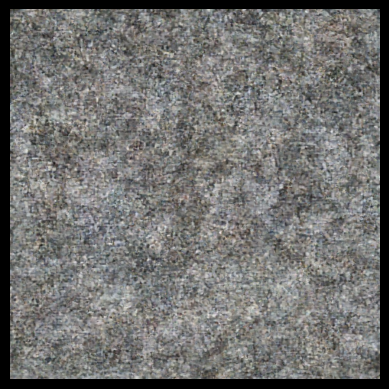

In [13]:
generate_test_sample()

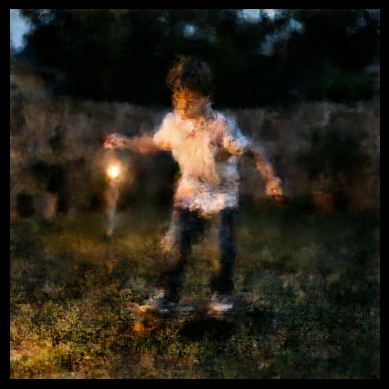

In [ ]:
from torch.utils.tensorboard import SummaryWriter

writer = SummaryWriter(log_dir="../../runs/flow_upscaler/example")

# The published FlowUpscaler model was trained on 20K blocks for ~150 epochs
epochs = 10

for epoch in range(0, epochs):
    num_steps = 0
    loss_sum = 0
    unet.train()
    for noise, latents_big, latents_div_2 in tqdm(train_loader):
        num_steps += 1

        latents_small = latents_div_2

        batch_size = latents_big.shape[0]
        latents_big = latents_big.cuda().float()
        latents_small = latents_small.cuda().float()
        noise = noise.cuda().float()

        sigmas = torch.rand(batch_size, device=device)
        timesteps = sigmas * num_train_timesteps
        sigmas = sigmas[:, None, None, None]

        noisy_latents = latents_big * (1 - sigmas) + noise * sigmas

        predicted_velocity = unet(
            sample=noisy_latents, timestep=timesteps, latents_small=latents_small
        )

        target = noise - latents_big

        loss = ((target - predicted_velocity) ** 2).mean()

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        loss_sum += float(loss.item())

        if num_steps % 100 == 0:
            generate_test_sample(epoch_number=epoch)
            unet.train()

    writer.add_scalar("train_loss", loss_sum / num_steps, epoch)
    generate_test_sample(epoch_number=epoch)

    torch.save(unet.state_dict(), "../../trained_models/autosave.pth")

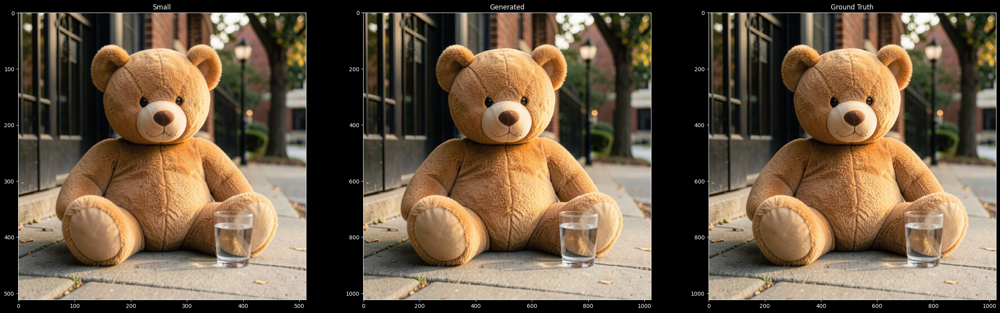

In [85]:
test_model()

In [ ]:
# torch.save(unet.state_dict(), "../../trained_models/flow_upscaler-3.3.pth")

In [15]:
state_dict = torch.load("../../trained_models/flow_upscaler-3.2.pth", weights_only=True)

unet.load_state_dict(state_dict)

<All keys matched successfully>

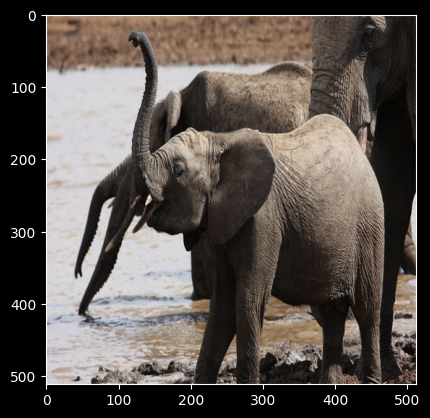

In [99]:
img = Image.open("../../coco2017/train2017/000000000757.jpg").convert("RGB")
img = img.resize((512, 512))
plt.imshow(img)
plt.show()

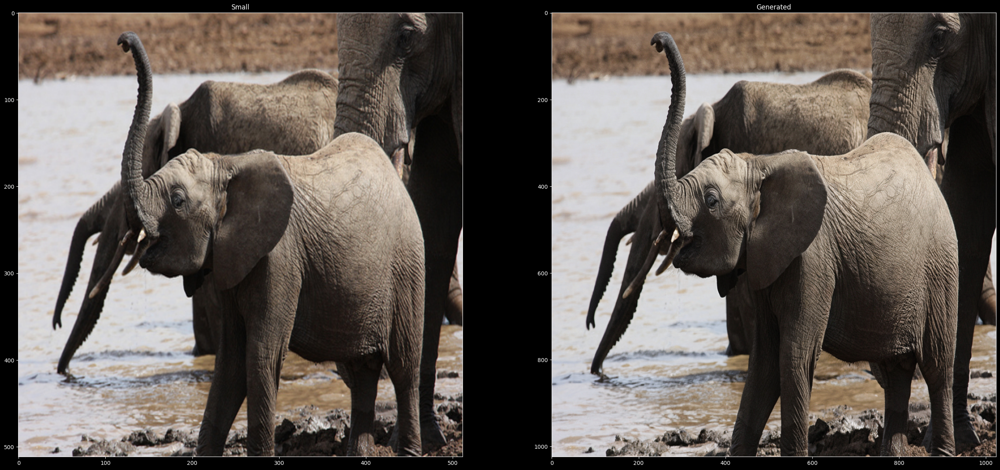

In [100]:
upscale_image(img)